In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=2

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=2


In [2]:
from cuml.manifold.umap import UMAP as cumlUMAP

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [4]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir
from avgn.visualization.spectrogram import draw_spec_set
from avgn.utils.buckeye_utils import VOWEL_CONSONANT
from avgn.signalprocessing.create_spectrogram_dataset import flatten_spectrograms


### load data

In [5]:
DATASET_ID = 'buckeye'

In [6]:
df_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'phones_uniform_32.pickle'
df_loc

PosixPath('/local/home/tsainbur/github_repos/avgn_paper/data/syllable_dfs/buckeye/phones_uniform_32.pickle')

In [7]:
syllable_df = pd.read_pickle(df_loc)

In [8]:
syllable_df[:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key,rate,spectrogram
0,24.457298,24.722471,ah,uh,0,0,0,0,s25,0,o,f,s2501b,16000,"[[0, 0, 0, 0, 0, 1, 0, 19, 97, 138, 152, 160, ..."
1,24.722471,24.792000,ih,it's,1,1,0,1,s25,0,o,f,s2501b,16000,"[[195, 168, 157, 159, 157, 156, 159, 157, 155,..."
2,24.792000,24.847660,t,it's,2,1,1,1,s25,0,o,f,s2501b,16000,"[[235, 216, 198, 187, 172, 158, 146, 128, 105,..."


In [9]:
# individuals
pd.DataFrame({i:[np.sum(syllable_df.indv == i)] for i in syllable_df.indv.unique()})

,s25,s08,s24,s40,s15,s17,s13,s16,s26,s35,...,s32,s01,s14,s28,s29,s31,s39,s04,s33,s21
0,25202,22740,20594,20875,24782,15757,27232,34809,13275,26874,...,17189,14526,26115,20719,23643,15280,20782,19112,17679,13974


In [10]:
# most frequent_phones
freq_phones = (
    pd.DataFrame(
        {i: [np.sum(syllable_df.labels == i)] for i in syllable_df.labels.unique()}
    )
    .T.sort_values(by=0, ascending=False)[:45]
    .T
)
freq_phones

,ah,ih,n,s,eh,t,iy,r,k,l,...,en,uh,sh,aw,ch,jh,el,em,zh,own
0,70395,63002,49641,41791,36258,33962,33462,30467,27235,27012,...,6241,6056,5985,4934,4750,4525,4145,3003,1007,669


#### cluster and plot

In [11]:
VOWEL_CONSONANT

{'consonants': {'Plosives': ['p', 't', 'k', 'b', 'd', 'g', 'tq'],
  'Affricates': ['ch', 'jh'],
  'Nasals': ['m', 'n', 'ng'],
  'Fricatives': ['f', 'v', 'th', 'dh', 's', 'z', 'sh', 'zh', 'hh'],
  'Liquids': ['l', 'el', 'r', 'er', 'ern'],
  'Glides': ['w', 'y'],
  'Labials': ['p', 'b', 'm', 'f', 'v'],
  'Coronals': ['th',
   'dh',
   't',
   'd',
   'n',
   's',
   'z',
   'sh',
   'zh',
   'r',
   'er',
   'ern',
   'l',
   'el'],
  'Dorsals': ['y', 'k', 'g', 'ng'],
  'Laryngeals': ['hh']},
 'vowels': {'Diphthong': ['ay', 'ey', 'oy', 'aw', 'ow'],
  'Long vowels': ['iy', 'aa', 'ao', 'uw'],
  'Short vowels': ['ih', 'eh', 'ae', 'ah', 'uh'],
  'High vowels': ['iy', 'ih', 'uh', 'uw'],
  'Mid vowels': ['eh', 'ah', 'ao'],
  'Low vowels': ['ae', 'aa'],
  'Front vowels': ['ih', 'ey', 'eh', 'ae'],
  'Central vowels': ['ah'],
  'Back vowels': ['uw', 'uh', 'ow', 'ah', 'aa'],
  'Syllabic consonants': ['em', 'en', 'el', 'er']}}

In [12]:
cuml_umap = cumlUMAP()

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  """Entry point for launching an IPython kernel.


In [ ]:
from avgn.visualization.projections import (
    scatter_projections,
)

In [ ]:
nex = -1

In [61]:
subset_df[:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key,rate,spectrogram
2,24.792000,24.847660,t,it's,2,1,1,1,s25,0,o,f,s2501b,16000,"[[235, 216, 198, 187, 172, 158, 146, 128, 105,..."
12,25.778605,25.922000,k,contract,12,5,0,5,s25,0,o,f,s2501b,16000,"[[87, 26, 0, 0, 11, 11, 18, 7, 0, 0, 0, 0, 2, ..."
15,26.057436,26.126855,d,contract,15,5,3,5,s25,0,o,f,s2501b,16000,"[[79, 56, 29, 4, 0, 0, 2, 1, 0, 0, 9, 14, 4, 0..."


In [64]:
subset_df['embedding'] = list(z)

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


consonants Plosives


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


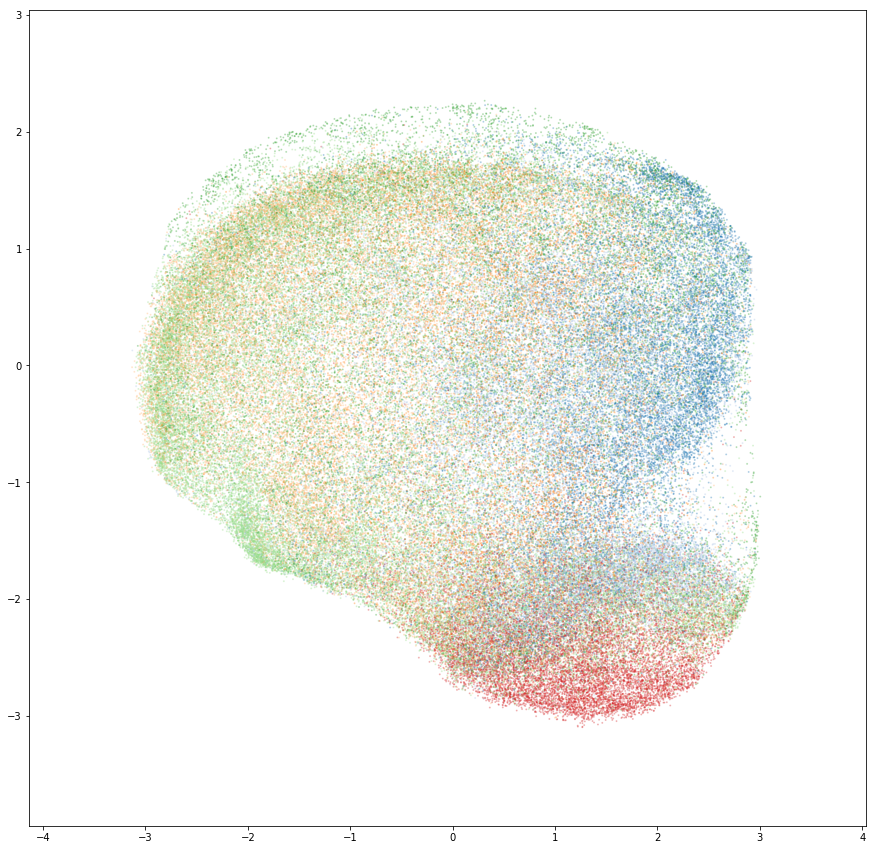

consonants Affricates


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


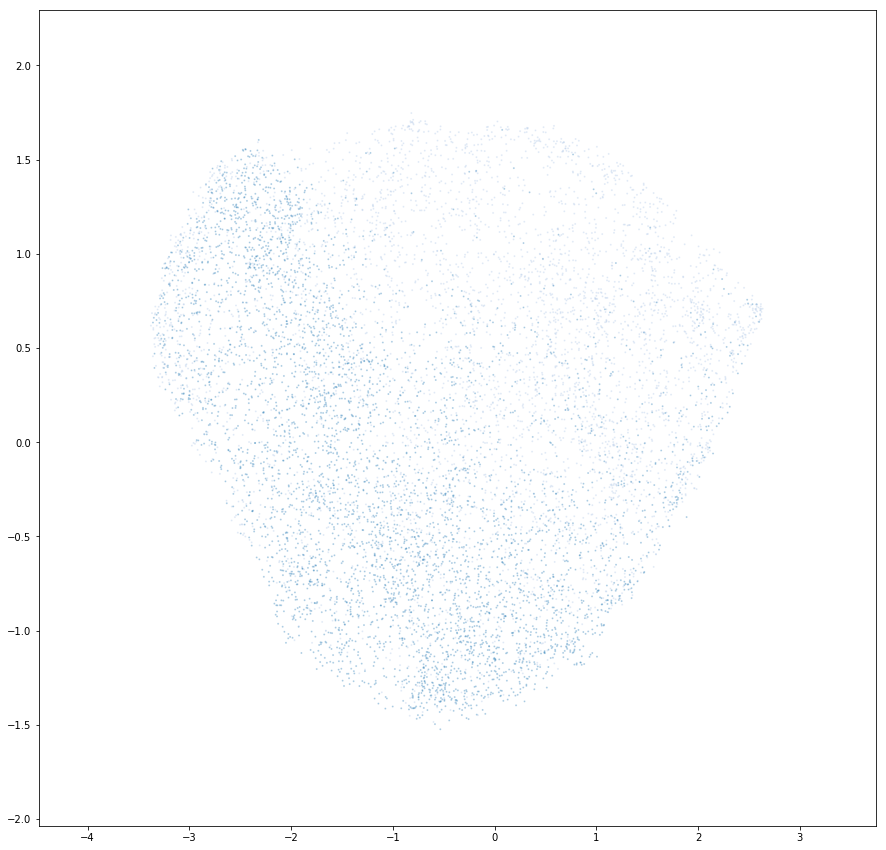

consonants Nasals


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


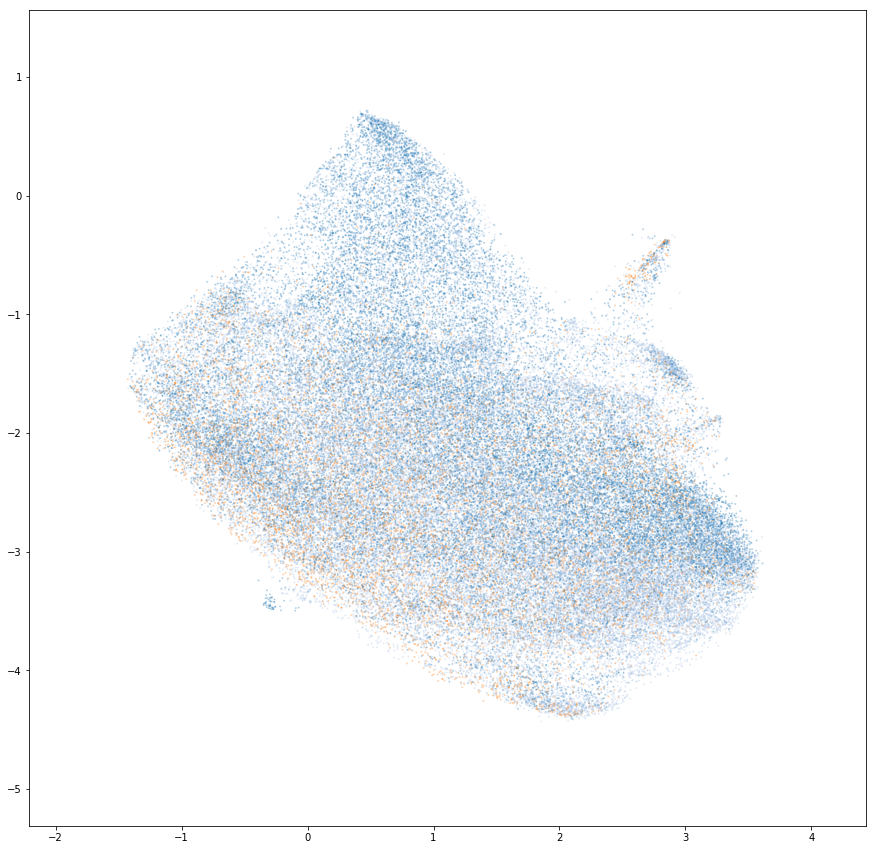

consonants Fricatives


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


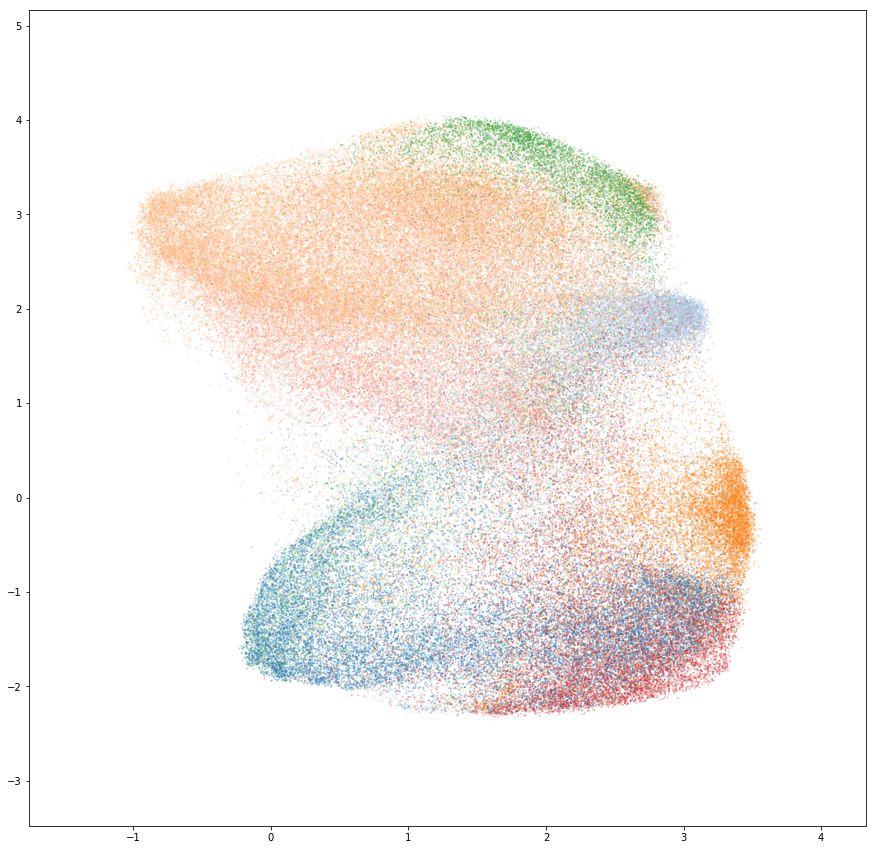

consonants Liquids


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


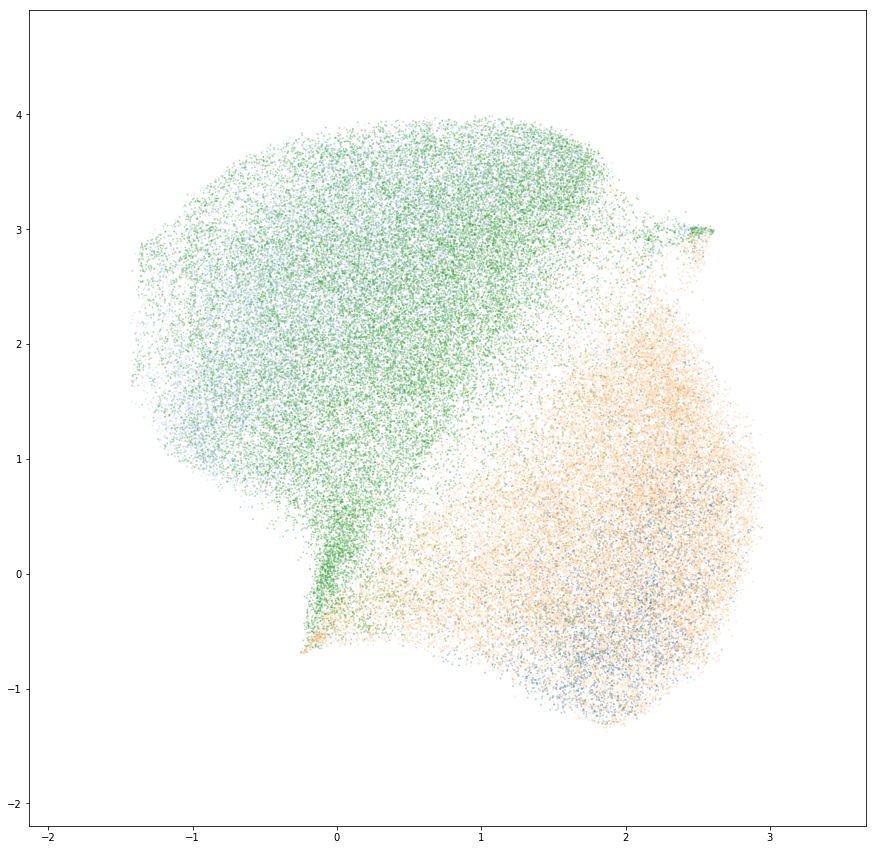

consonants Glides


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


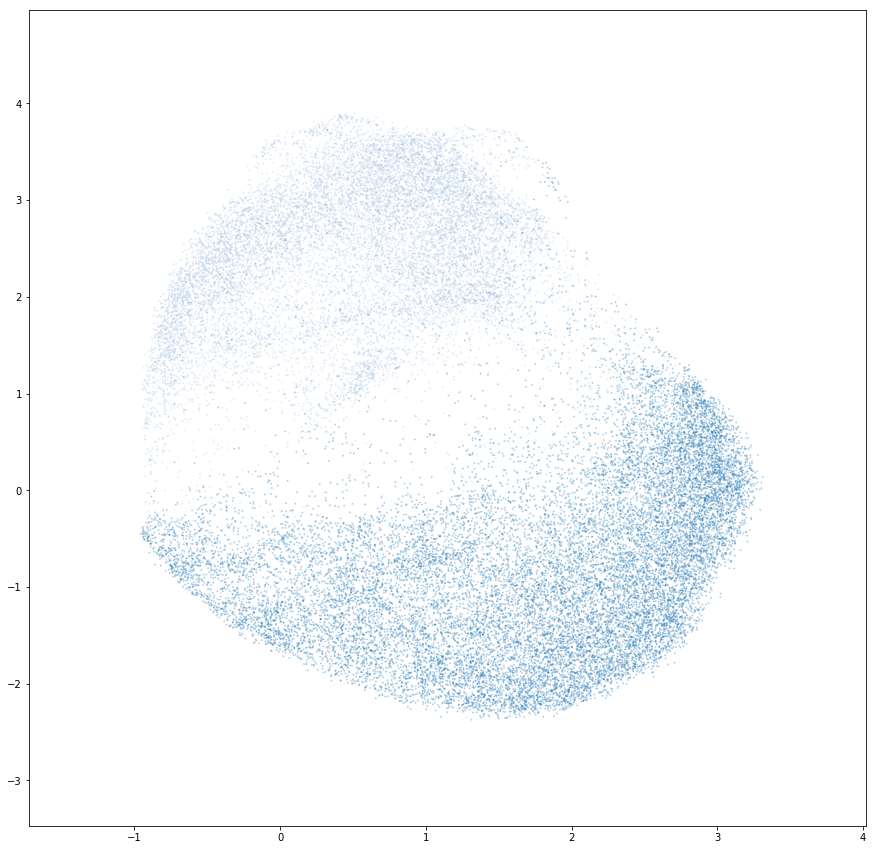

consonants Labials


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


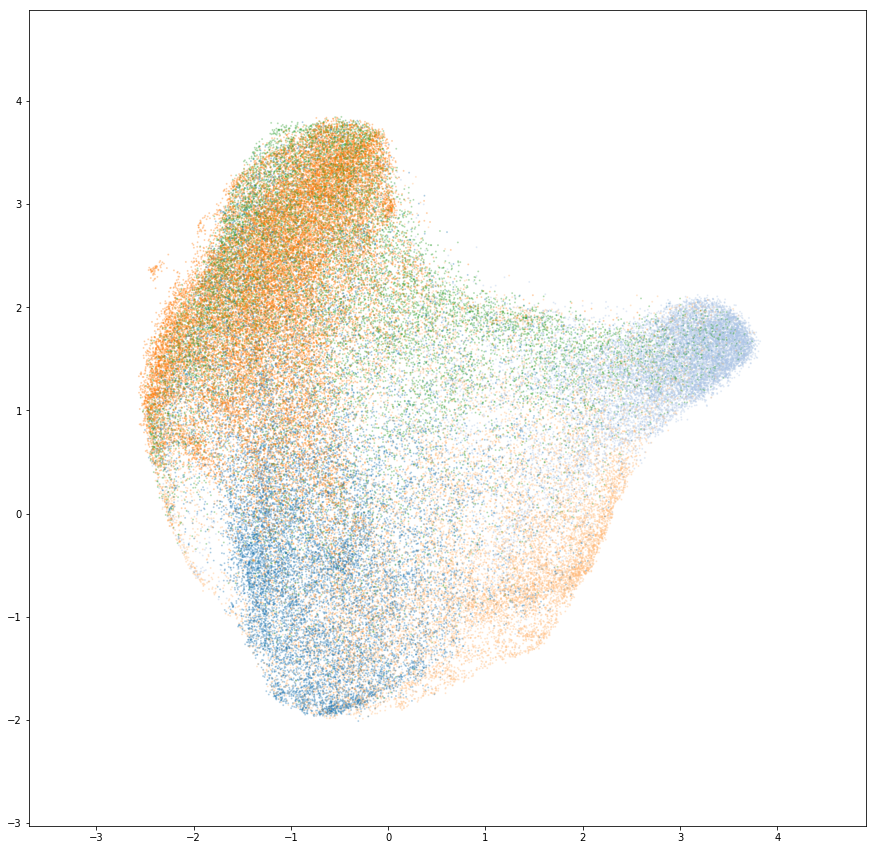

consonants Coronals


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


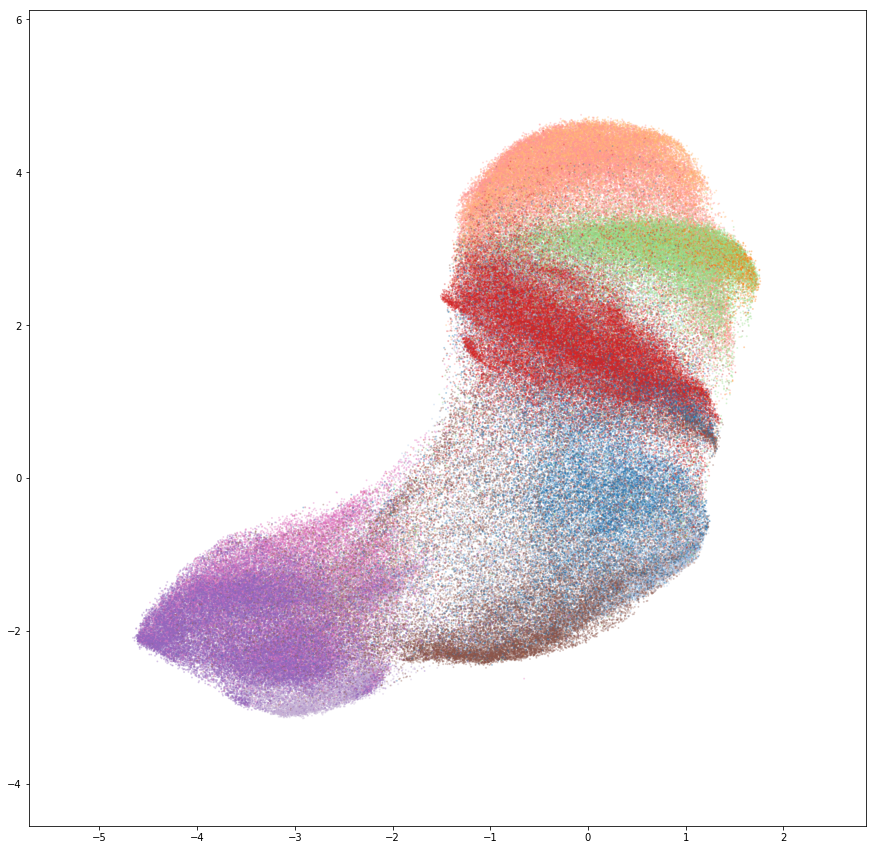

consonants Dorsals


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


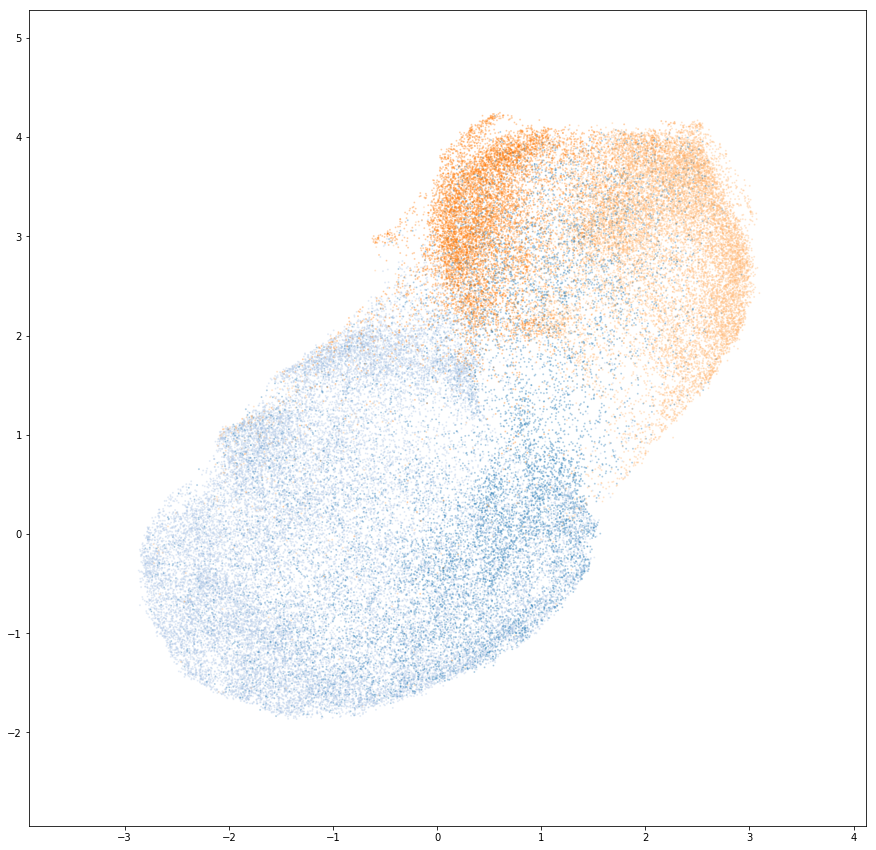

consonants Laryngeals


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


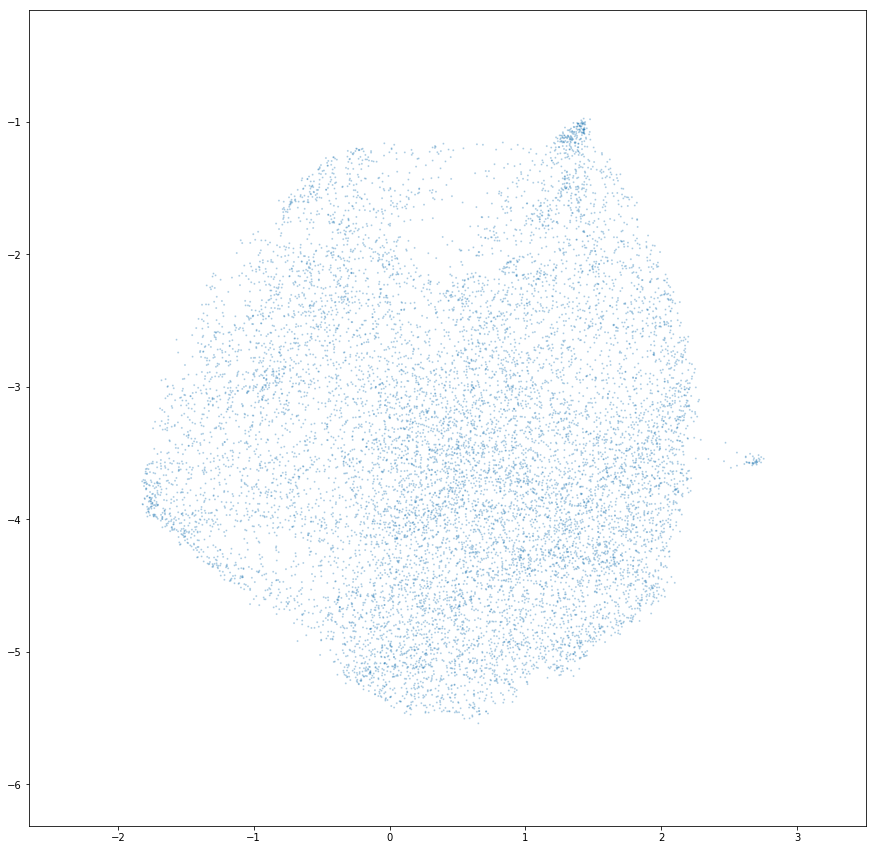

vowels Diphthong


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


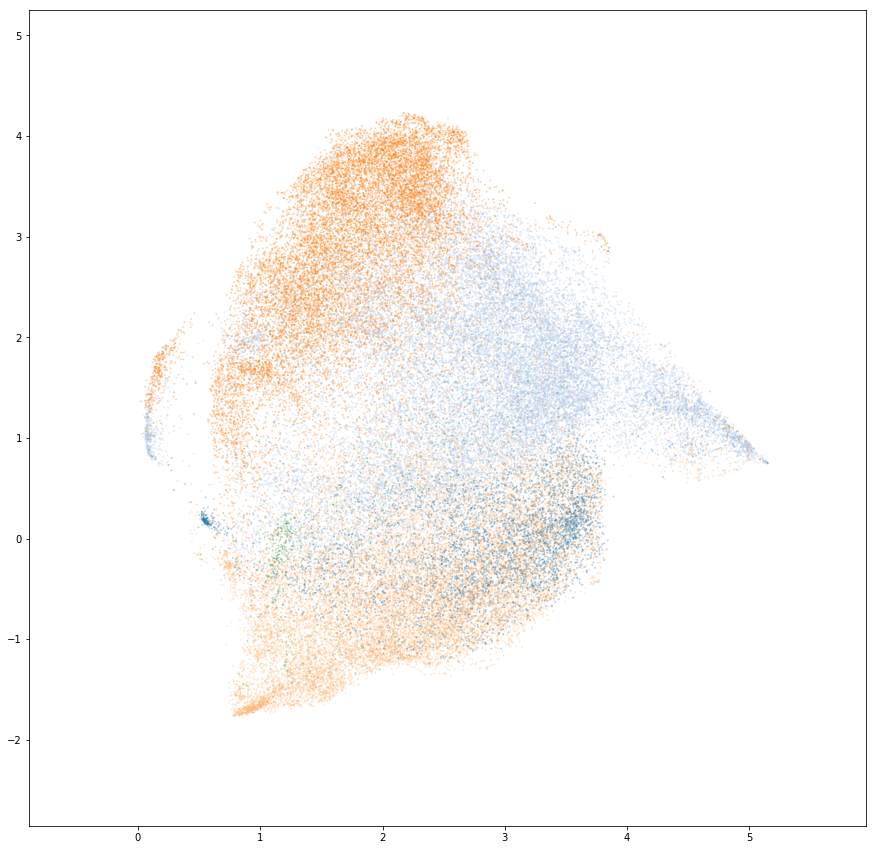

vowels Long vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


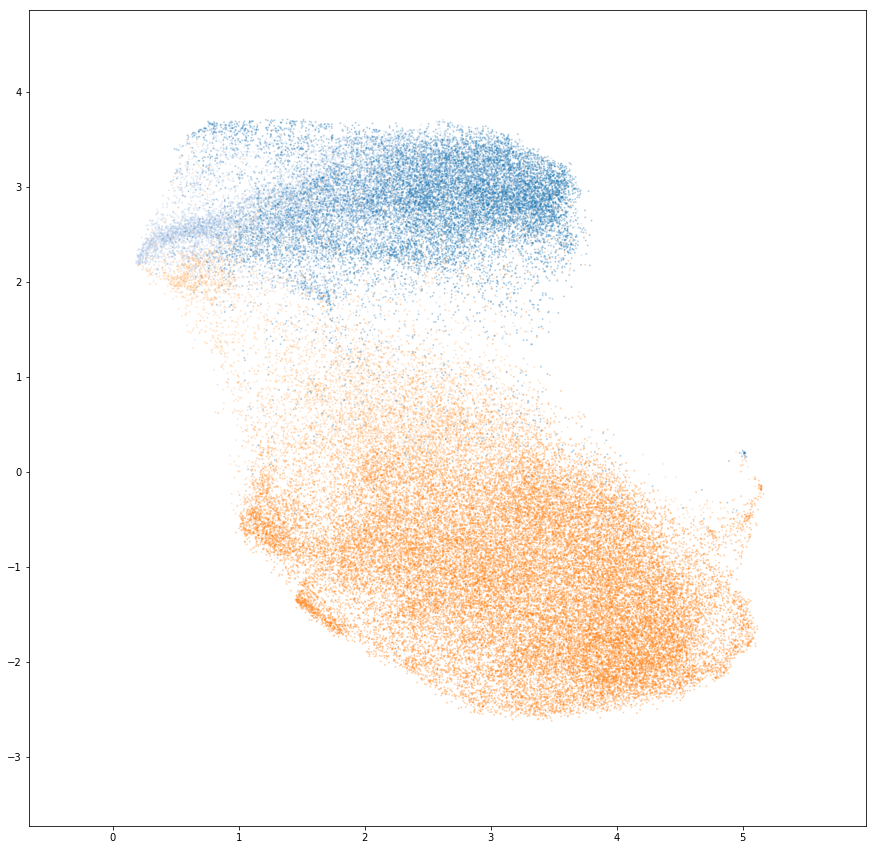

vowels Short vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


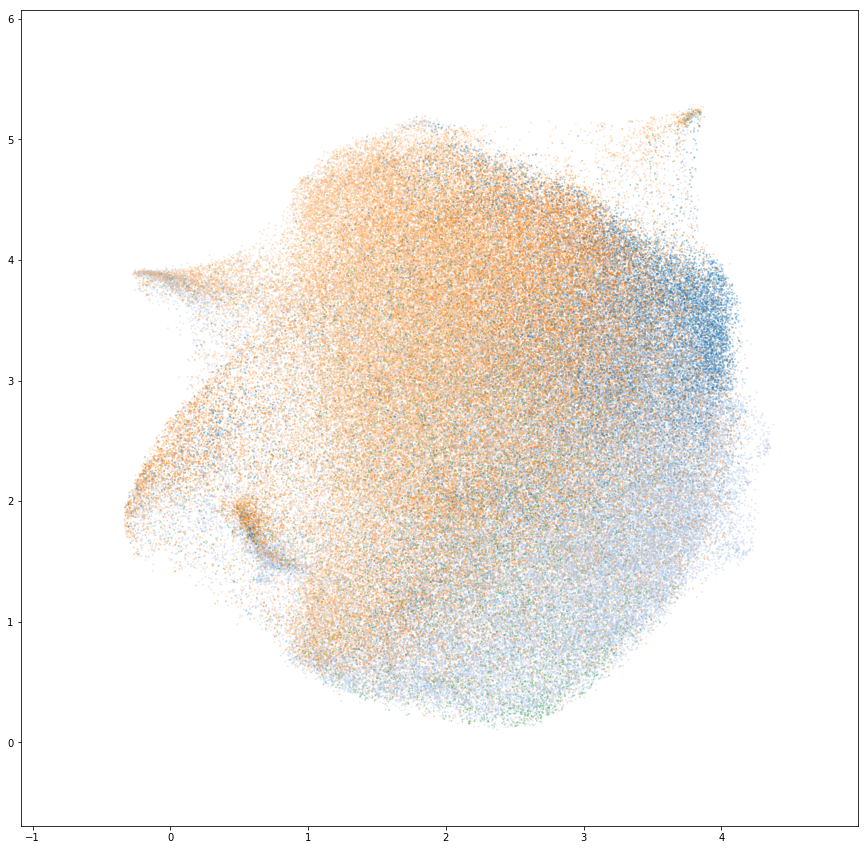

vowels High vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


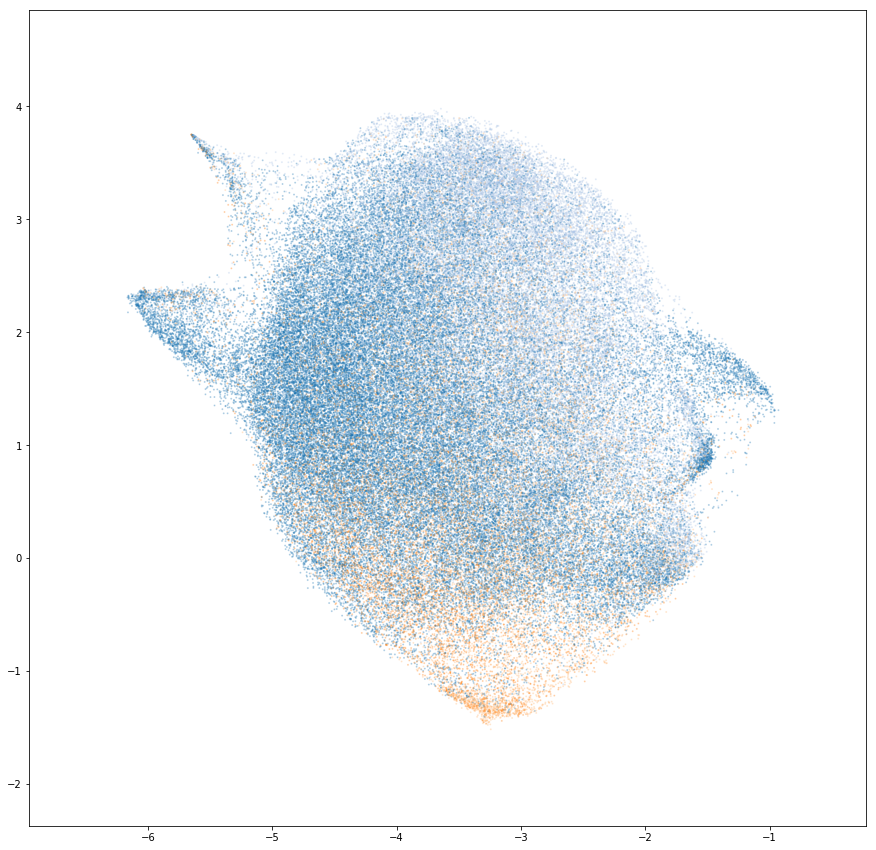

vowels Mid vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


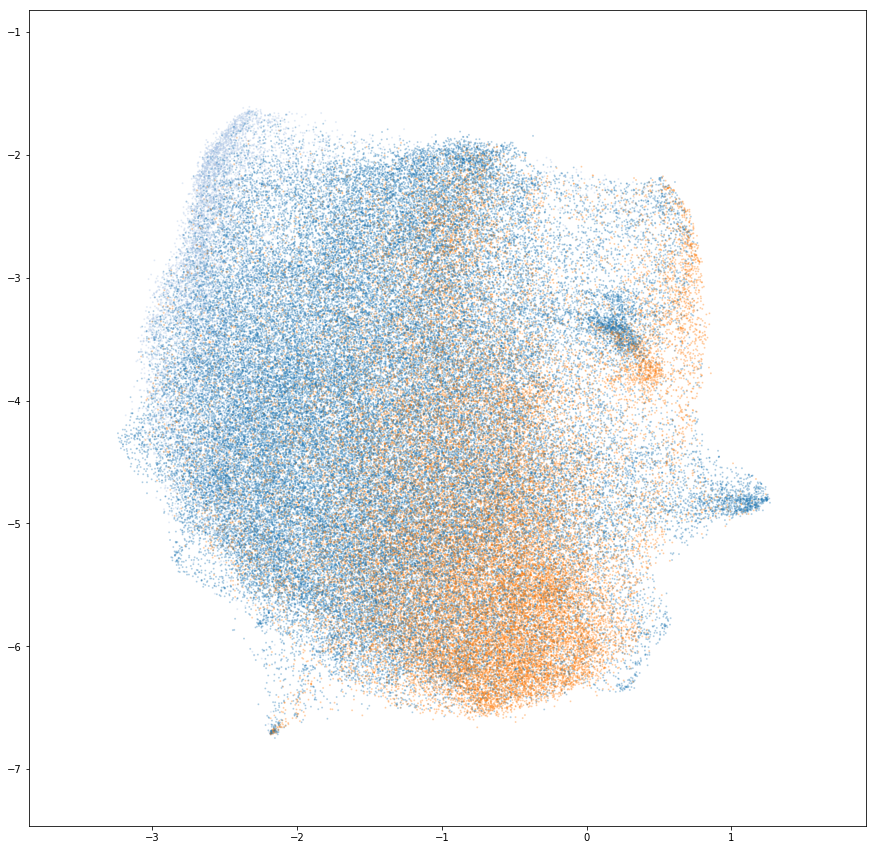

vowels Low vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


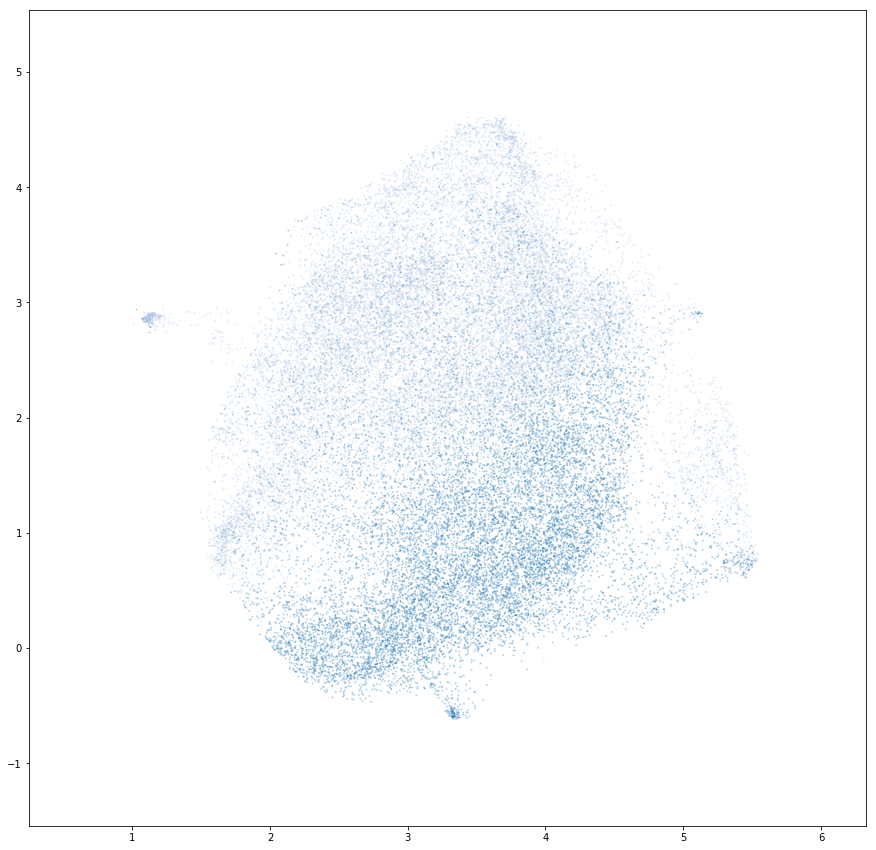

vowels Front vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


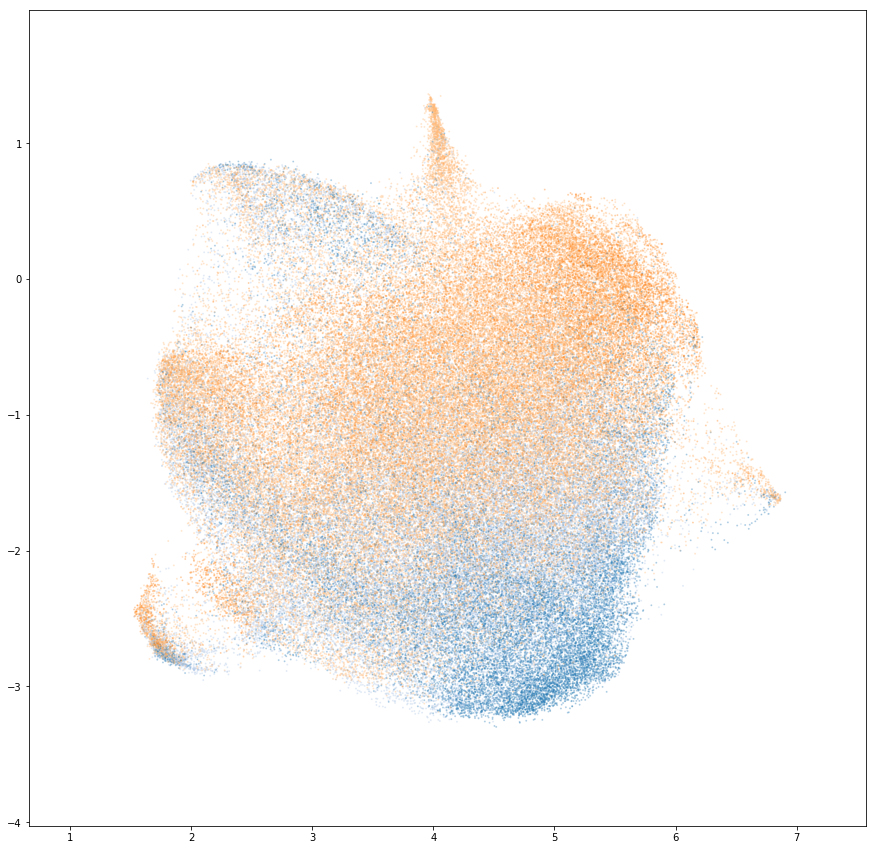

vowels Central vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


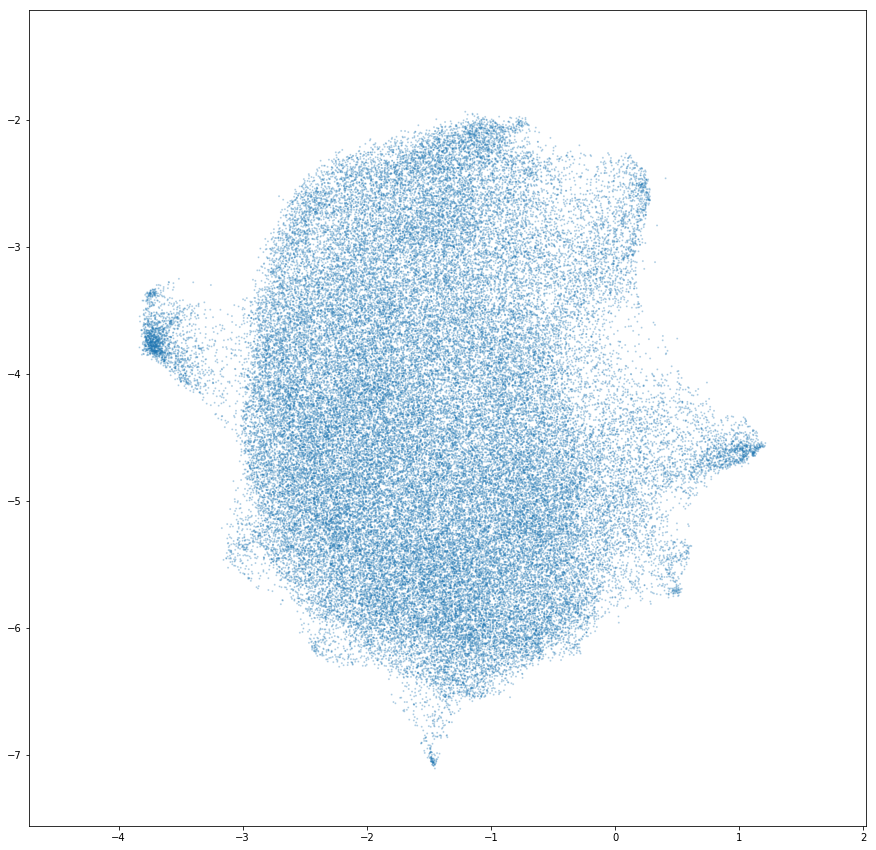

vowels Back vowels


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


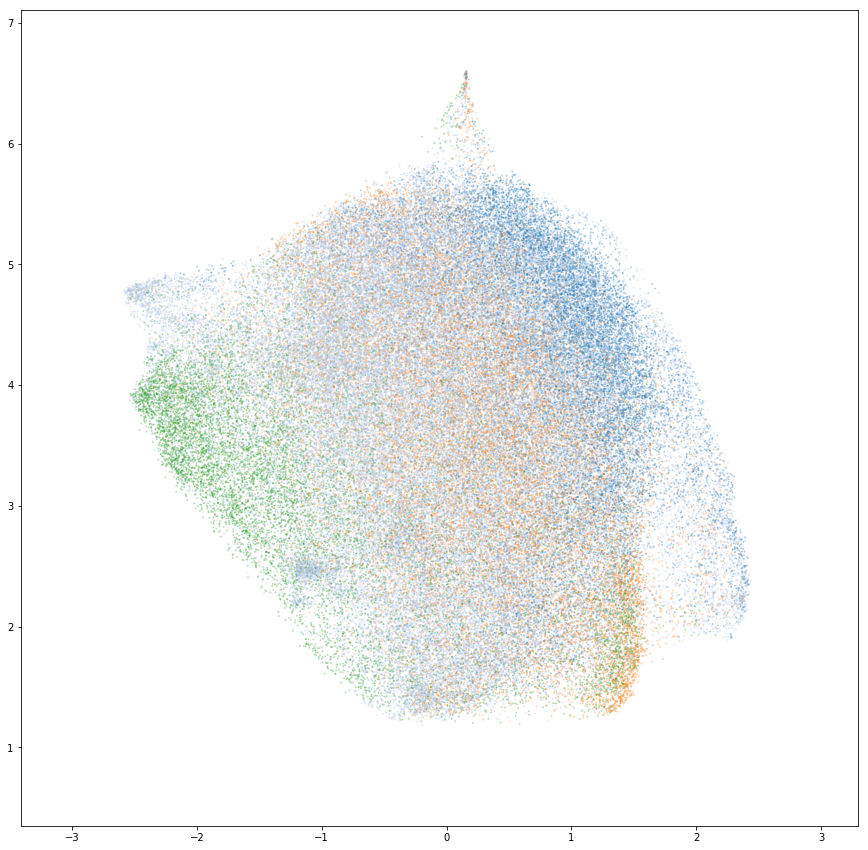

vowels Syllabic consonants


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:16: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  app.launch_new_instance()
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:17: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 


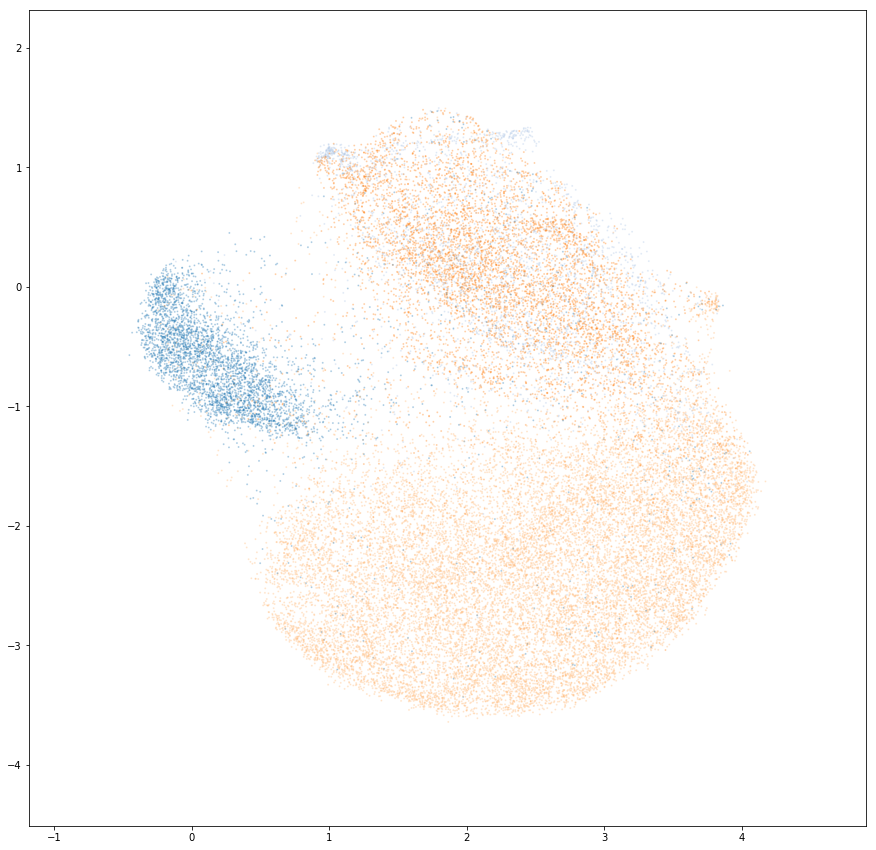

In [65]:
embedding_dict = {}

for cat in ['consonants', 'vowels']:
    embedding_dict[cat] = {}
    for phone_group in VOWEL_CONSONANT[cat].keys():
        print(cat, phone_group)
        phone_list = VOWEL_CONSONANT[cat][phone_group]
        
        # subset dataframe
        subset_df = syllable_df[syllable_df.labels.isin(phone_list)]

        # flatten spectrograms
        specs_flattened = flatten_spectrograms(list(subset_df.spectrogram.values))

        # embed data
        cuml_umap = cumlUMAP()
        embedding = cuml_umap.fit_transform(specs_flattened)
        z  = list(embedding)
        subset_df['embedding'] = z
        embedding_dict[cat][phone_group] = subset_df
        
        z = np.vstack(z)
        
        # get data limits
        div = 5
        xmin, ymin = np.percentile(z, 0.25, axis=0)
        xmax, ymax = np.percentile(z, 99.75, axis=0)

        x_diff = xmax - xmin
        xmax += x_diff / div
        xmin -= x_diff / div
        y_diff = ymax - ymin
        ymax += y_diff / div
        ymin -= y_diff / div
        xmin, ymin, xmax, ymax
        
        
        # plot data 
        fig, ax = plt.subplots(figsize=(15, 15))
        scatter_projections(
            projection=z[:nex],
            alpha=0.25,
            labels=subset_df.labels.values[:nex],
            s=1,
            ax=ax,
            show_legend=False,
        )
        ax.set_xlim([xmin,xmax])
        ax.set_ylim([ymin,ymax])

        plt.show()


In [75]:
ensure_dir(DATA_DIR / 'syllable_dfs' / DATASET_ID / 'embeddings' / 'test')

In [76]:
for cat in ['consonants', 'vowels']:
    for phone_group in tqdm(VOWEL_CONSONANT[cat].keys()):
        save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID /  'embeddings' / (cat + '_' + phone_group + '.pickle')
        embedding_dict[cat][phone_group].to_pickle(save_loc)


In [68]:
embedding_dict[cat][phone_group][:3]

,start_time,end_time,labels,word,utterance_number,position_in_utterance,position_in_word,word_number,indv,indvi,age,sex,key,rate,spectrogram,embedding
2,24.792000,24.847660,t,it's,2,1,1,1,s25,0,o,f,s2501b,16000,"[[235, 216, 198, 187, 172, 158, 146, 128, 105,...","[0.5269148349761963, -1.194445013999939]"
12,25.778605,25.922000,k,contract,12,5,0,5,s25,0,o,f,s2501b,16000,"[[87, 26, 0, 0, 11, 11, 18, 7, 0, 0, 0, 0, 2, ...","[-2.130523443222046, 0.568821132183075]"
15,26.057436,26.126855,d,contract,15,5,3,5,s25,0,o,f,s2501b,16000,"[[79, 56, 29, 4, 0, 0, 2, 1, 0, 0, 9, 14, 4, 0...","[-2.6745007038116455, -0.5522710084915161]"
